# Data 620 Final Project 

## Ali Harb


The objective of this project is to analyze comments from reddit social community discussions web using social networking and text processing tools. Through this document we will study if there are correlations between central nodes and sentiments from comments. 

## Libaries

Headers used to clean data and perform the sentiments and the network analysis 

In [319]:
import pandas as pd
import pymysql
import matplotlib.pyplot as plt
import networkx as nx
from networkx.algorithms import bipartite as bi
import operator 
from operator import itemgetter
import numpy as np
import community
import itertools
from multiprocessing import Pool
import matplotlib.colors as mcolors
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk.classify import SklearnClassifier
import wordcloud
from wordcloud import WordCloud,STOPWORDS
from sklearn.model_selection import train_test_split
from subprocess import check_output
import csv
import scipy.stats

Download the vader_lexicon package from the nltk to process text analysis

In [320]:
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

## Import Data

Import data into Python

In [321]:
sql_con = pymysql.connect(host='104.196.212.179', port=3306, 
                          user='root', passwd='data620pw',
                          db='reddit')

In [322]:
reddit = pd.read_sql('SELECT DISTINCT author, responder, COUNT(1) as weight FROM comments '
                     'GROUP BY author, responder '
                     'HAVING author<>"[deleted]" AND responder<>"[deleted]";', con=sql_con)

reddit_comment = pd.read_sql('SELECT * from comments;', con=sql_con)


In [323]:
users = pd.read_sql('SELECT username, betweenness, degree FROM users', con=sql_con)
 
sql_con.close()



In [324]:
reddit.loc[0:5]

,author,responder,weight
0,---DevilsAdvocate---,dannybtw,1
1,---DevilsAdvocate---,ThisFreaknGuy,2
2,-Covariance,DomeSlave,1
3,-Mountain-King-,ASK_ABOUT_STEELBEAMS,3
4,-Mountain-King-,AvoidNoiderman,2
5,-Mountain-King-,Bigfrostynugs,1


## Raw Data Visualization

Prepare the data to compile the weighted G graph 

In [325]:
G = nx.Graph()

# Add nodes
nodes = set(reddit.loc[:, "author"])
authorNodes=nodes
responderNodes=reddit.loc[:, "responder"]
nodes.union(set(reddit.loc[:, "responder"]))
nodes = list(nodes)
G.add_nodes_from(nodes)
edges=[tuple(x) for x in reddit.loc[:, "author":"responder"].values]
G.add_weighted_edges_from([tuple(x) for x in reddit.values])

Print the graph information

In [326]:
print(nx.info(G))

Name: 
Type: Graph
Number of nodes: 10233
Number of edges: 15756
Average degree:   3.0794


The data is large for python to process. It is a graph type with 10233 nodes and 15756 edges with 3.0794 average degree.

Test for graph connectivity

In [327]:
print(nx.is_connected(G))

False


Since the graph is not fully connected, lets check how many hubs are interconnected.  

In [328]:
nx.number_connected_components(G)

129

129 hubs where found within the network. Let’s find out what the size these huss and investigate if there is isolated nodes.

Test to make sure there isn't isolated node

In [329]:
print(list(nx.isolates(G)))

[]


In [330]:
[len(c) for c in sorted(nx.connected_components(G), key=len, reverse=True)[0:10]]

[9928, 9, 6, 5, 5, 5, 5, 5, 4, 4]

The results above show that there is one large hub in the network. The rest of the small groups can be ignored since they are isolated and very small in size (less than 10 nodes per group) compare to 9928. The result also indicates that there are no isolated nodes. 

Create a layout position using spring method to plot the raw data

In [19]:
spring_posg=nx.spring_layout(G)

Plot the raw data to identify graph components and connections.

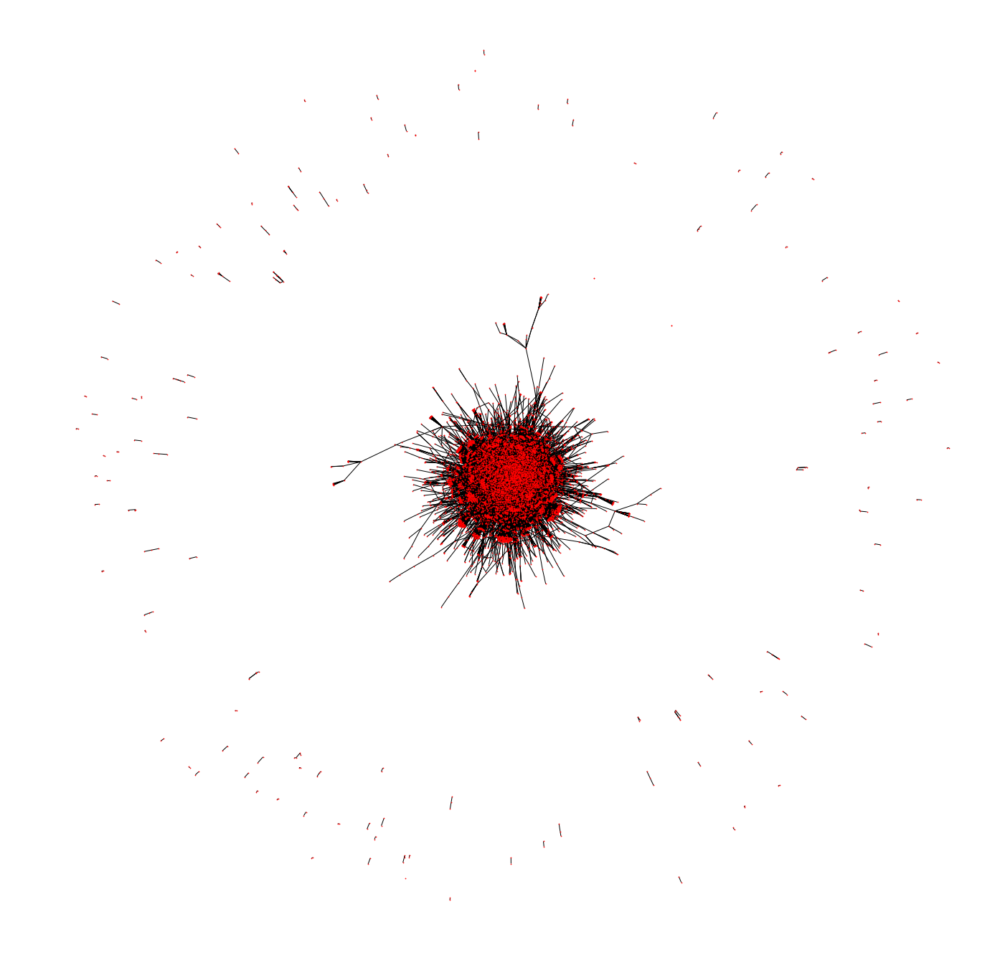

In [21]:
fig = plt.gcf()
fig.set_size_inches(24,24)
plt.axis("off")
nx.draw_networkx(G,pos=spring_posg,with_labels = False,node_size = 0.5)
plt.show()

As expected there is a big community surrounded by very small groups. The next step is to subset and focuses on the largest hub. 

## Network Analysis



Create an subgraph for the big hub

In [331]:
# Select the largest connected subgraph
H= nx.Graph
H = max(nx.connected_component_subgraphs(G), key=len)
H.number_of_nodes()
print(nx.info(H))

Name: 
Type: Graph
Number of nodes: 9928
Number of edges: 15576
Average degree:   3.1378


The graph information shows that this hub is the dominant of the network.

Create a layout position using spring method for the g grapgh

In [23]:
spring_posh=nx.spring_layout(H)

Plot the new graph using community partition to visualize the different groups within the community.

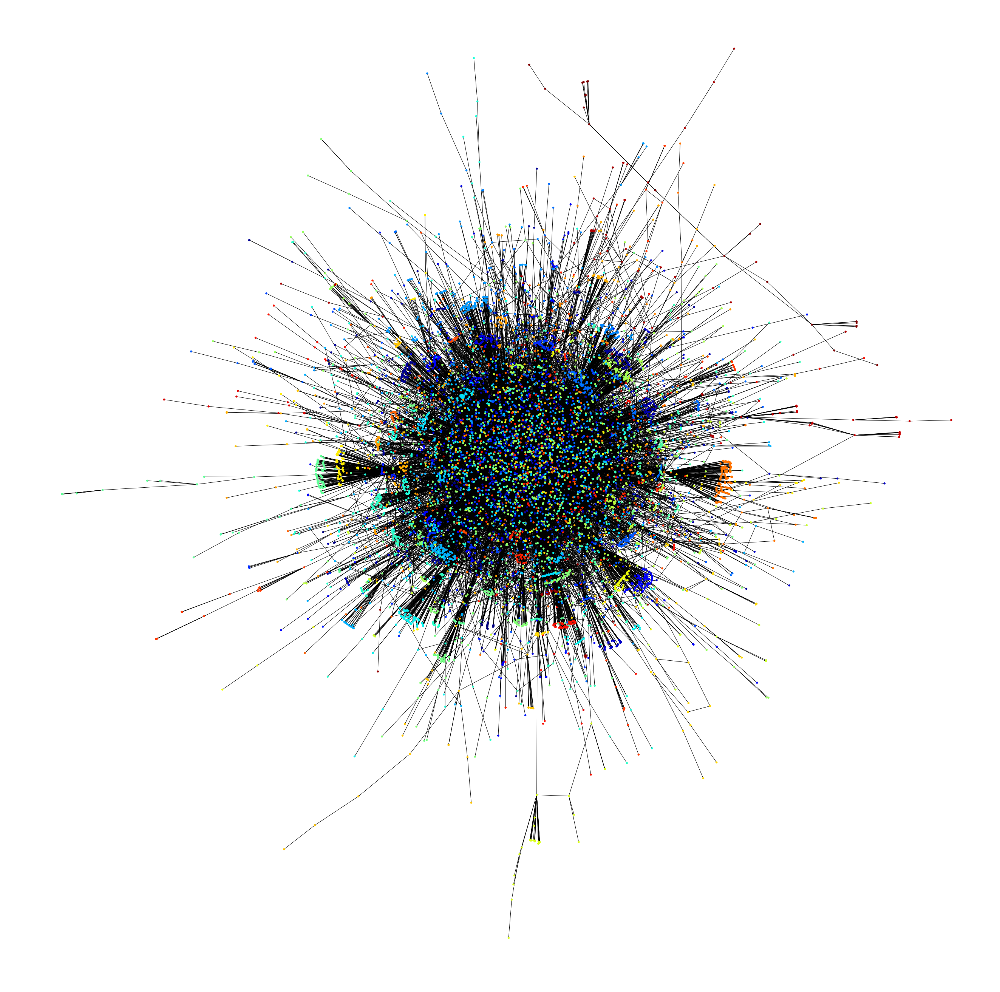

In [25]:
parts = community.best_partition(H)
values = [parts.get(node) for node in H.nodes()]
fig = plt.gcf()
fig.set_size_inches(36,36)
nx.draw_spring(H,cmap = plt.get_cmap('jet'), node_color = values, node_size=20, with_labels=False)
plt.show()

The colorful graph shows that the community is connected by many hubs.
Before proceeding with the analysis, let’s find the diameter of the network, the longest possible connection, and the average shortest path length.


In [26]:
nx.diameter(H)

16

In [34]:
nx.average_shortest_path_length(H, weight='weight')

5.211905025136356

The diameter of 16 with around 10000 nodes indicates that people within the hubs doesn’t have strong intercommunications.  

Create a data frame to display the users names and weight.

In [139]:
user1=[]
user2=[]
wg=[]

d=sorted(H.edges(data=True))

for i in range(0,15576):
    user1.append(d[i][0])
    user2.append(d[i][1])
    tempmg=d[i][2]
    tempmg=tempmg["weight"]
    wg.append(tempmg)

    
displayTopDegree=pd.DataFrame({"User1":user1,"User2":user2,"Weight":wg})
displayTopDegree=displayTopDegree.sort_values(by=['Weight'],ascending=False)

print(displayTopDegree[0:20])

                    User1                 User2  Weight
11307        isthisatrick            uber_kitty      21
6150     Rich700000000000      Rich700000000000      20
2634              Fabius0               jama211      17
2431         DukePristine            uber_kitty      15
32           0therworldly     PsychoPhilosopher      14
9793       crazymuffin147               jama211      13
10248           escalat0r  -TheCabbageMerchant-      13
8775         averysadgirl    StrawberryMeringue      10
4968                Mkins             Taakbiiir       9
7779          Trevmiester              onioning       9
2628              Fabius0         Kombat_Wombat       8
9072               besjbo         Altered_Amiba       8
9994             dgrant92                NicoUK       8
13595           reelybruh         Sister_Winter       8
10871            hattmall           mypussypops       8
1200   Boudicca_Rebellion             Sassywhat       8
1638       Capinboredface                 TThor 

The following are functions for converting dict to list and to create Customized graph.

In [140]:
# convert dict to list
def convertToList(dictObject):
    temp = []
    dictlist = []
    for key, value in dictObject.items():
        temp = [key,value]
        dictlist.append(temp)

    return dictlist

In [141]:
# pass 0 for key and 1 for Value for ValueOrKey parameter
# pass a dict for dictObject
def convertToListPerCol(dictObject,ValueOrKey):
    temp = []
    dictlist = []
    for key, value in dictObject.items():
        temp = [key,value]
        dictlist.append(temp[ValueOrKey])

    return dictlist

In [142]:
def drawGraph(G, pos, measures, measure_name,fscale,dscale):
    temp = []
    dictlist = []
    for key, value in measures.items():
        temp = [key,value]
        dictlist.append(temp[1])
    value=dictlist
    valueColor=[x for x in value]
    value=[x*(10000*dscale) for x in value]
    fsize=int(8*fscale/4)
    nodes = nx.draw_networkx(G, pos,node_size=value, cmap=plt.cm.plasma, 
                                   node_color=valueColor,
                                   font_size=fsize,
                                   alpha=.7,
                                   edge_size=0.5,
                                   with_labels=False,
                                   nodelist=measures.keys())
    
    nx.draw_networkx_edges(G, pos, alpha=.1, width=1, edge_color='black', style='dashed')
        
    fig = plt.gcf()
    fig.set_size_inches(24,20)
    plt.title(measure_name)
    plt.axis('off')

Calculate the betweenness centrality of the network to find the most import nodes in term of hub joint, a betweenness that links a group of nodes to rest of the network.

In [31]:
# Calculate betweenness centrality
centr_bw_w = nx.betweenness_centrality(H, weight='weight')

Calculate the degree centrality of the network to find the important nodes of the network based on the number of neighbors the node has. 

In [37]:
centr_deg = nx.degree_centrality(H)

In [332]:
# Combine betweenness and degree centralities into a single data frame
df1 = pd.DataFrame(convertToList(centr_bw_w), columns=['User', 'Betweenness'])
df2 = pd.DataFrame(convertToList(centr_deg), columns=['User', 'Degree'])
users = df1.join(df2.set_index('User'), on='User')
users.sort_values(['Betweenness', 'Degree'], ascending = False, inplace=True)
print(users[0:10])

                  User  Betweenness    Degree
1772          corby315     0.075942  0.026012
1378       USOutpost31     0.075000       NaN
899       CatNamedJava     0.054289       NaN
850          0xD153A53     0.052643       NaN
294        LordOfTongs     0.045981  0.017341
1262        GameSkatez     0.043398  0.023121
731               SD__     0.042016       NaN
1230           RWDMARS     0.041822       NaN
1877  badgerX3mushroom     0.038010       NaN
333       palettendieb     0.035360       NaN


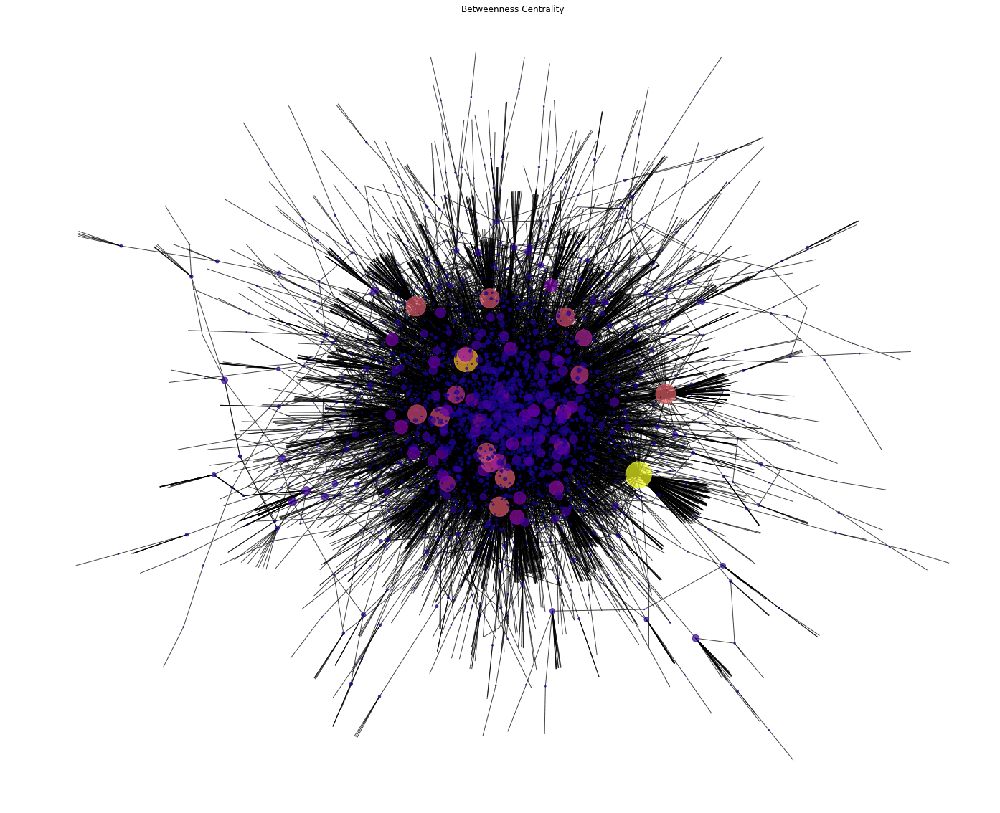

In [71]:
drawGraph(H,spring_posh,centr_bw_w, 'Betweenness Centrality',3,1.5)

As shown above if we look at the circumference outliers of the network, there is some nodes, the small dark purple colors, connected to a very few other nodes but they are visible in term of their importance as a hub joint. At the circumference there are many nodes serve as the single joint hub to large network users. If we look at the core of the network it seems to have a lot of betweenness with moderate size. The network structure seems to be bounded this way and not depended on few nodes that can cause destruction to whole network when lost, hibernated or disconnect. The yellow and orange nodes has the largest hubs. 

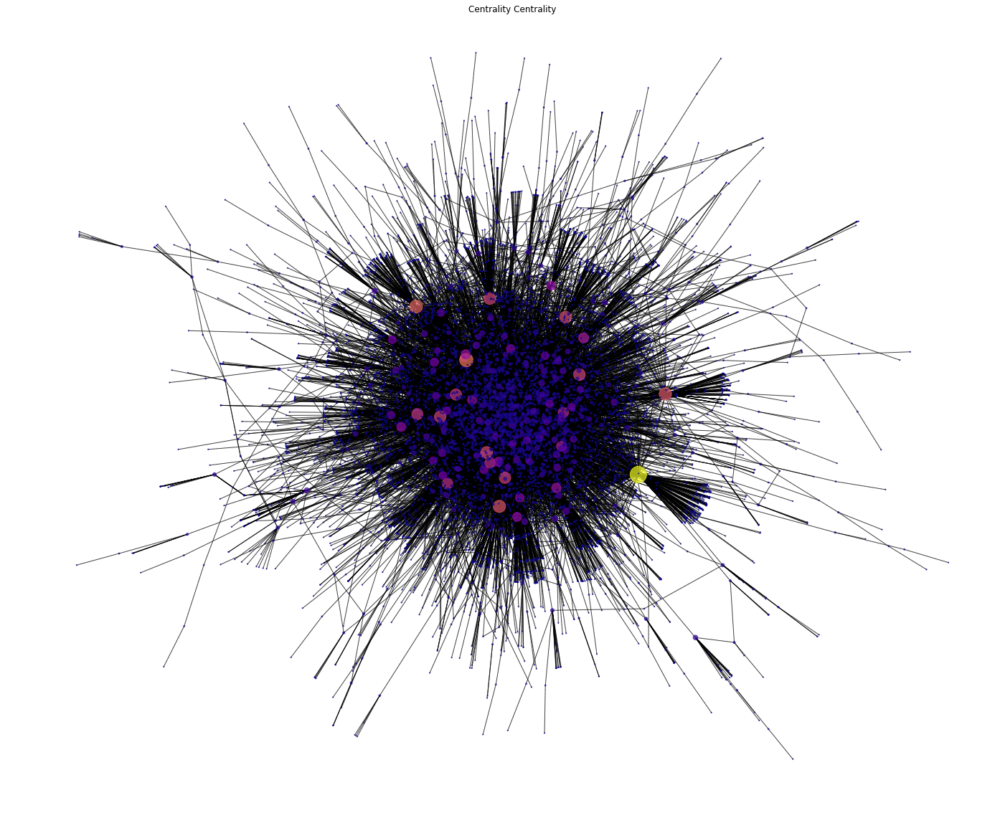

In [72]:
drawGraph(H,spring_posh,centr_deg, 'Centrality Centrality',3,1.5)

A lot of blue and purple colors nodes at the core of the network indicate that the degree of centrality between users is not strong. This means within the network hubs users are not communicating with each other as much. At the circumference of the network some of the betweenness nodes have high degree of centrality the yellow and red because of their position. The yellow hub seems to be the largest and the most important hub in the network in term of degree and betweenness centrality.

Let's measure the co-occurrence between the nodes in the network.

In [144]:
Co_Occurrence1={}
Co_Occurrence2={}
for w in displayTopDegree['User1']:
    Co_Occurrence1[w]=H.degree(w, weight='weight') 
for w in displayTopDegree['User2']:
    Co_Occurrence2[w]=H.degree(w, weight='weight')

Function to split a dict into two lists

In [145]:
def splitDict(d,n):
    i = iter(d.items())      # alternatively, i = d.iteritems() works in Python 2

    d1 = dict(itertools.islice(i, n))   # grab first n items
    d2 = dict(i)                        # grab the rest

    return d1, d2

Graph function that can take bunch of node and turn them into a G graph

In [146]:
def GetEgoNode(Node):
    E = nx.Graph(nx.ego_graph(G,Node))
    pos=nx.spring_layout(E)

    Enodes=E.nodes()
    EtempNodes=list(Enodes)
    EtempNodes.remove(Node)
    
    EcO_Occurence={}
    for w in displayTopDegree['User1']:
        EcO_Occurence[w]=H.degree(w, weight='weight') 

    v1,v2=splitDict(EcO_Occurence,list(Enodes).index(Node))
    v1[Node]= Co_Occurrence1[Node]
    NodesSize = {**v1,**v2}
 
    valn = [v * 25 for v in NodesSize.values()]

    colormap =[]
    for n in E.nodes():
        if n==Node:
            colormap.append('yellow')
        else:
            colormap.append('red')
            
    #M=nx.blockmodel(G,E8,multigraph=True)
    fig = plt.gcf()
    fig.set_size_inches(36,36)
    plt.axis('off')
    nx.draw_networkx(E,pos,cmap=plt.cm.plasma,
                  node_size=valn,
                  font_size=16,
                  alpha=.6,
                  font_color='black',
                  node_color=colormap,
                  edge_color='g',
    )
    
    return E.nodes()

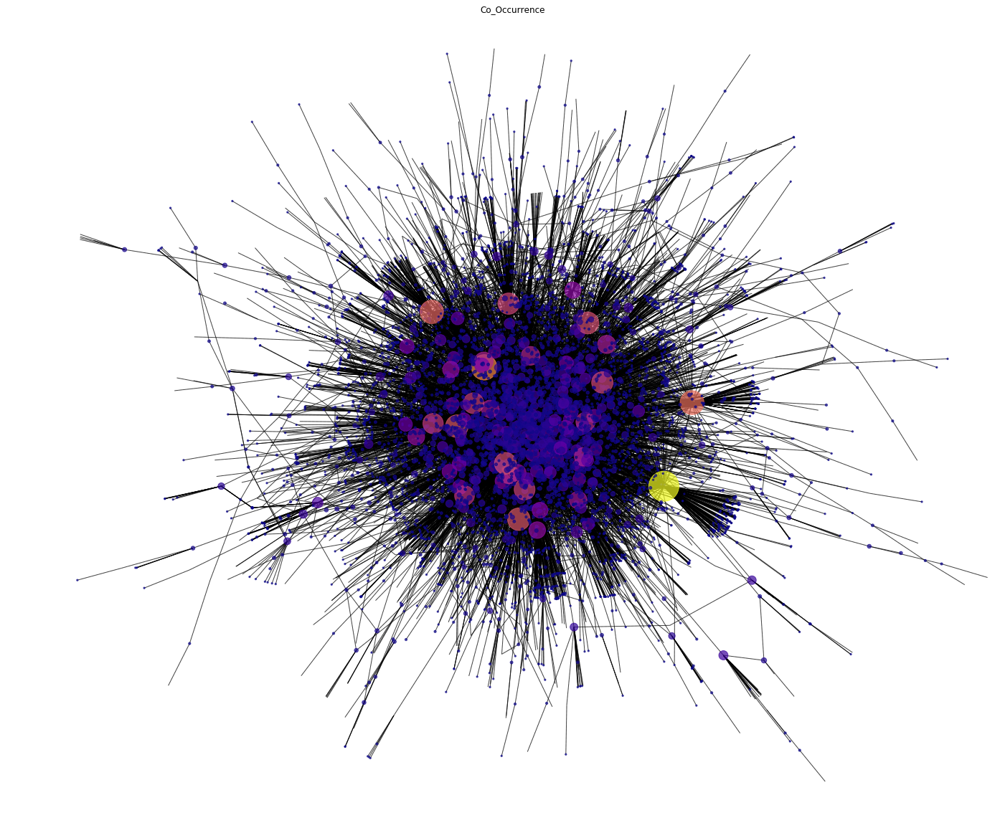

In [76]:
drawGraph(H,spring_posh,Co_Occurrence1, 'Co_Occurrence',.0025,.0005)

The above Co_Occurrence plot shows that users at the core of the network where much more connected and have more of intercommunication between users of different hubs and within the same hub.

Look into the CDC_ node the one that has the highest betweenness and degree centrality

In [333]:
print(users[0:10])

                  User  Betweenness    Degree
1772          corby315     0.075942  0.026012
1378       USOutpost31     0.075000       NaN
899       CatNamedJava     0.054289       NaN
850          0xD153A53     0.052643       NaN
294        LordOfTongs     0.045981  0.017341
1262        GameSkatez     0.043398  0.023121
731               SD__     0.042016       NaN
1230           RWDMARS     0.041822       NaN
1877  badgerX3mushroom     0.038010       NaN
333       palettendieb     0.035360       NaN


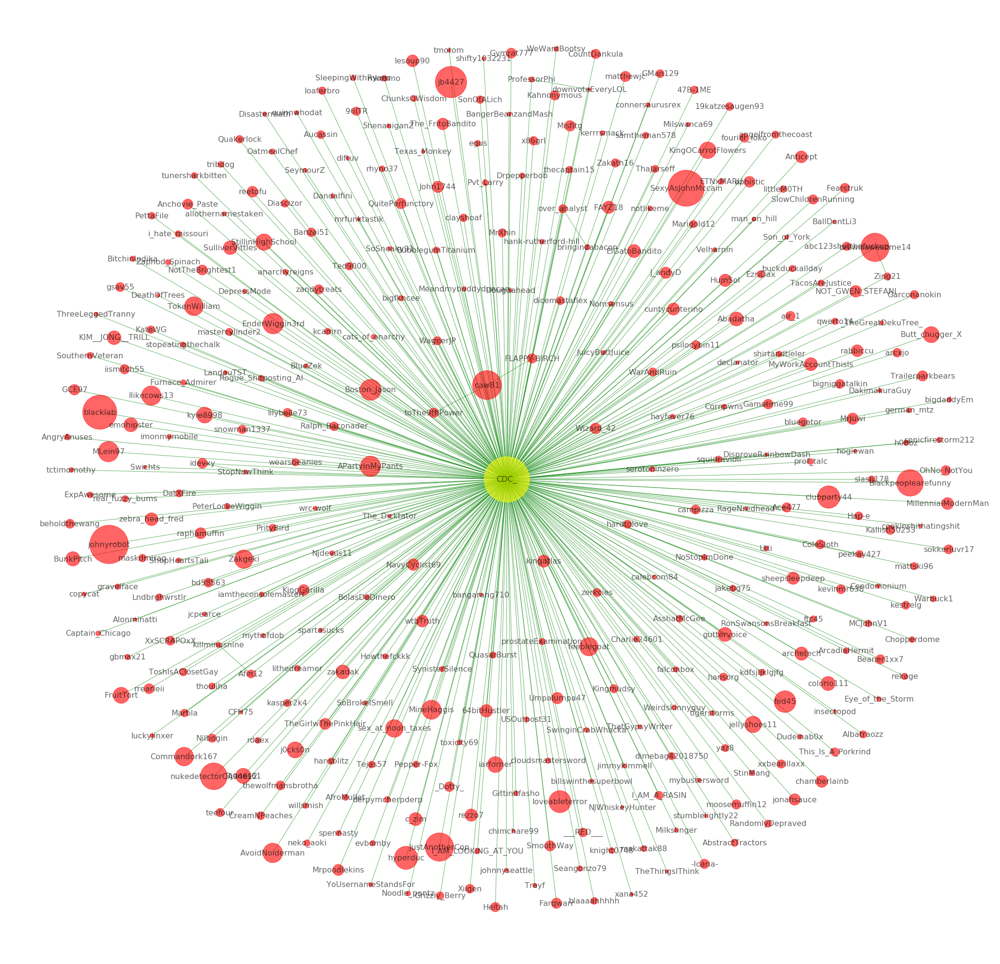

In [78]:
disp1=GetEgoNode('CDC_')

The graph above shows that most of the communications are directed with the center node with exception of one or two nodes in the network that have direct link. Users seem to communicate with the center nodes at a different level. Few show a very strong relationship with the center node (the big red bobbles), they have a high co-occurrence weight.

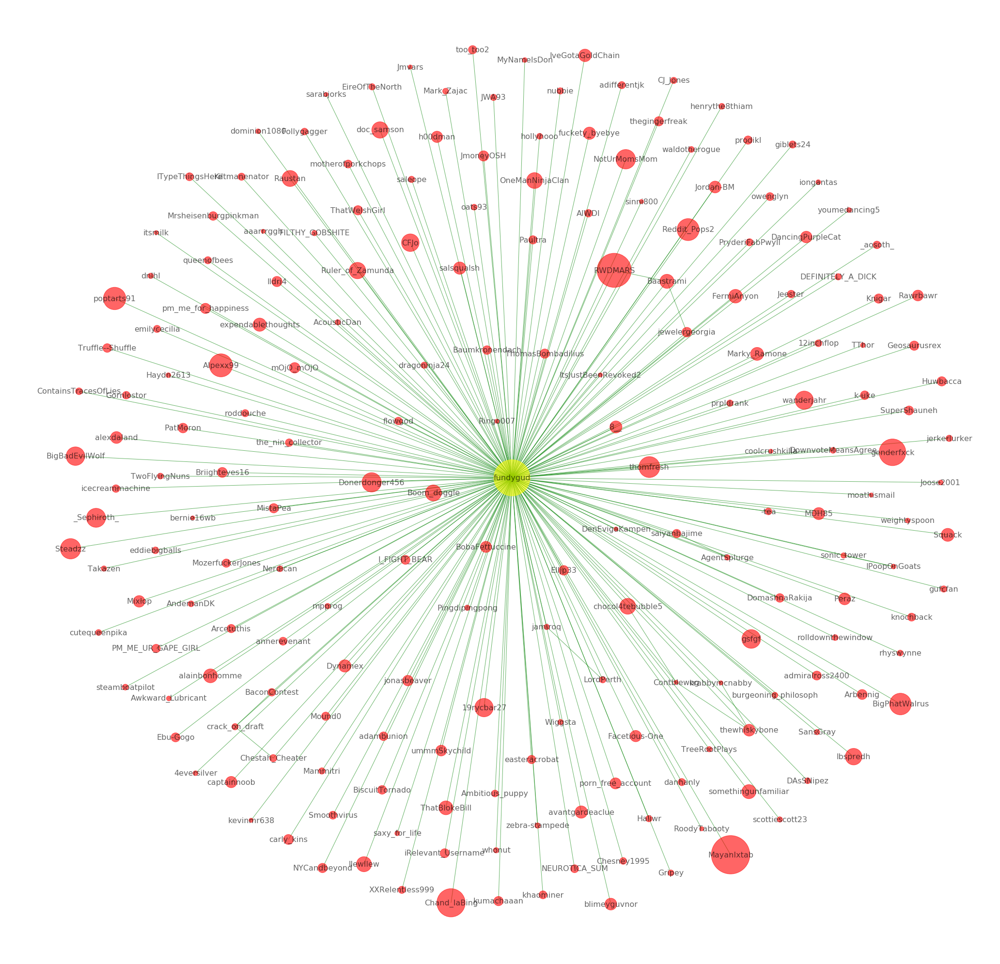

In [79]:
disp2=GetEgoNode('fundygud')

The above graph shows that some of the nodes have higher co-occurrence then the betweenness. This hub seems to be connected to other big hubs center that has more co-occurrence weight. 

let's get a hub farther down in the list of betweenness 

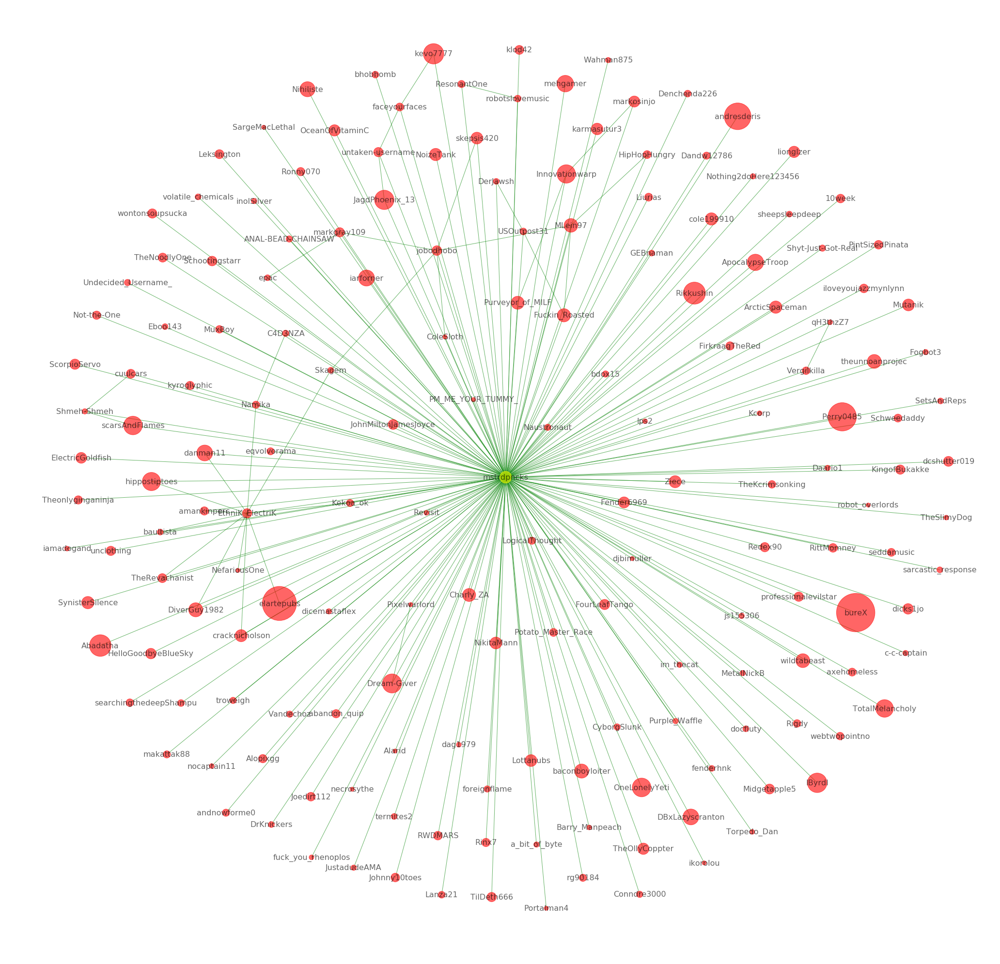

In [80]:
disp3=GetEgoNode('mstrdpncks')

mstrdpncks hub seems to have more intercommunication between its users. The hub has small groups that communicate with each which shows a good neighboring communication within mstrdpncks hub

As a result of investigating some of the hubs in the network based on betweenness level of importance, It seems that hubs with high degree of betweenness have a concentric commination. All users’ nodes communicate directly with betweenness node solely with some exception. While, the nodes with lower betweenness levels seems to have more intercommunication between user in the network and some of them has group chat within the hubs as shown in mstrdpncks

Graph function that takes a bunch of nodes, find their neighbors, plot the graph and return it.

In [148]:
def graphNeighbors(Node):
    
    main = Node
    subG = H.neighbors(main)
    n_list=list(subG)
    disp=n_list
    neighbors=n_list
    for i in disp:
        x=[n for n in H.neighbors(i)]
        neighbors=neighbors+x
   
        neighbors = list(set(neighbors))
    #print(neighbors)
    subG = H.subgraph(neighbors)
        # Layout
    pos=nx.spring_layout(subG)


    EcO_Occurence={}
    for w in neighbors:
        EcO_Occurence[w]=subG.degree(w, weight='weight') 
    

    temp = []
    dictlist = []
    cvalue=[]
    for key, value in pos.items():                
        dictlist.append(EcO_Occurence[key])
        cvalue=dictlist
        
    #valueColor=[x for x in cvalue]
    valueColor=cvalue    
    widthValues=[x*0.5 for x in cvalue]
    #valn = [v * 25 for v in cvalue]
    valn=cvalue
    valn = [v * 25 for v in valn]
    
    Lablemap={}
    label1=list(EcO_Occurence.keys())
    for i in range(len(label1)):
        if label1[i]==Node:
            Lablemap[label1[i]]=str(label1[i]) 
        else:
            Lablemap[label1[i]]=str('.')

    fig = plt.figure(figsize=(20,20))
    elarge=[(u,v) for (u,v,d) in subG.edges(data=True) if d['weight']>1]
    esmall=[(u,v) for (u,v,d) in subG.edges(data=True) if d['weight']==1]

       
    # Draw nodes
    nx.draw_networkx_nodes(subG,pos,node_color=valueColor,alpha=.9,node_size=valn)


    # Draw edges
    nx.draw_networkx_edges(subG, pos, edgelist=elarge,alpha=.8, width=widthValues, edge_color='r')
    nx.draw_networkx_edges(subG, pos, edgelist=esmall,alpha=.6, width=1, edge_color='green', style='dashed')
    nx.draw_networkx_labels(subG, pos, Lablemap)

    plt.axis('off')
    plt.show()
    plt.gcf().clear()
    
    return subG , valn

The following are betweenness nodes with radius of two

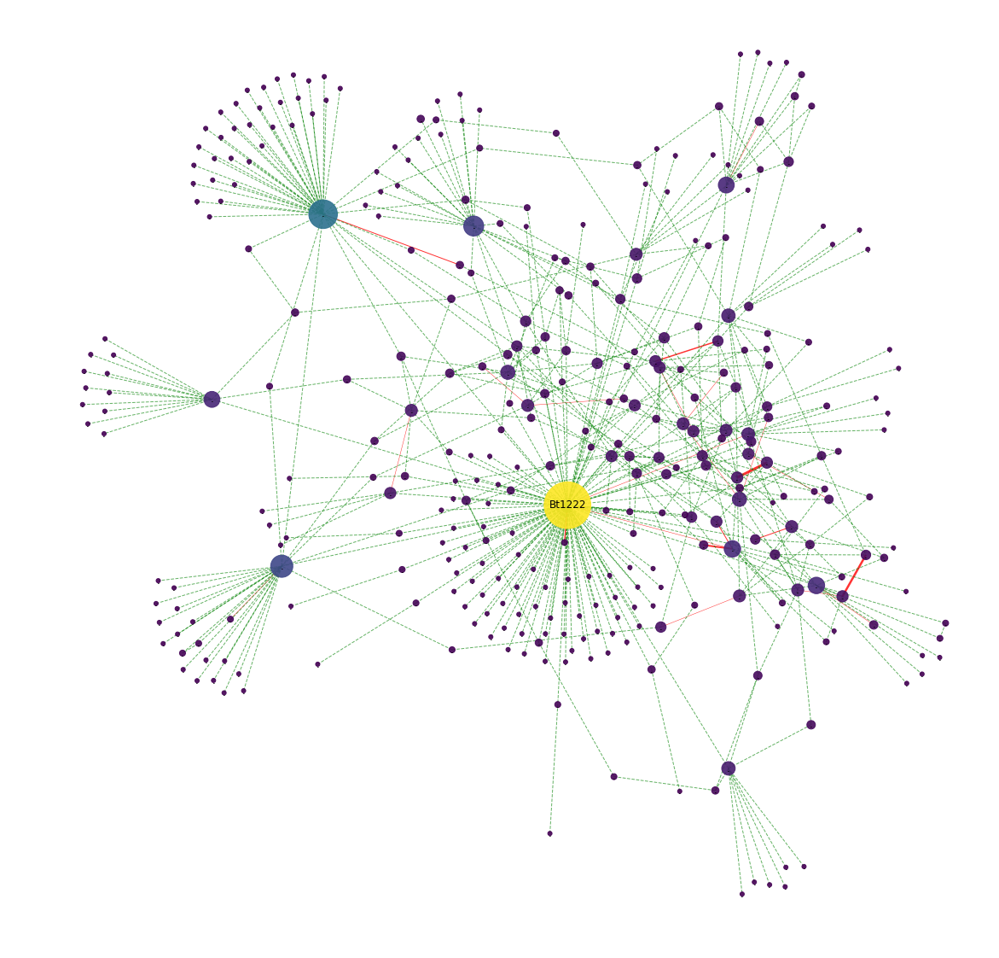

Number of nodes: 347


<Figure size 432x288 with 0 Axes>

In [86]:
G_Bt1222, W_Bt1222=graphNeighbors('Bt1222')
print('Number of nodes: '+ str(len(G_Bt1222)))

In [149]:
nx.diameter(G_Bt1222)

4

In [150]:
centr_bw_w = nx.betweenness_centrality(G_Bt1222, weight='weight')
sorted(centr_bw_w.items(), key=lambda kv: kv[1], reverse=True)[0:5]

[('Bt1222', 0.8620936327896237),
 ('djpossess', 0.22015314214421985),
 ('HEYdontIknowU', 0.12920096379005658),
 ('MyWorkAccountThisIs', 0.10489430621875971),
 ('alyssajones', 0.07084453300462347)]

The above central node with second neighbors can sum up to 347 nodes with few small hubs. The node has direct connection with every hub around. The longest shortest path on the community is 4. the degree of centrality within two radius is 86%.

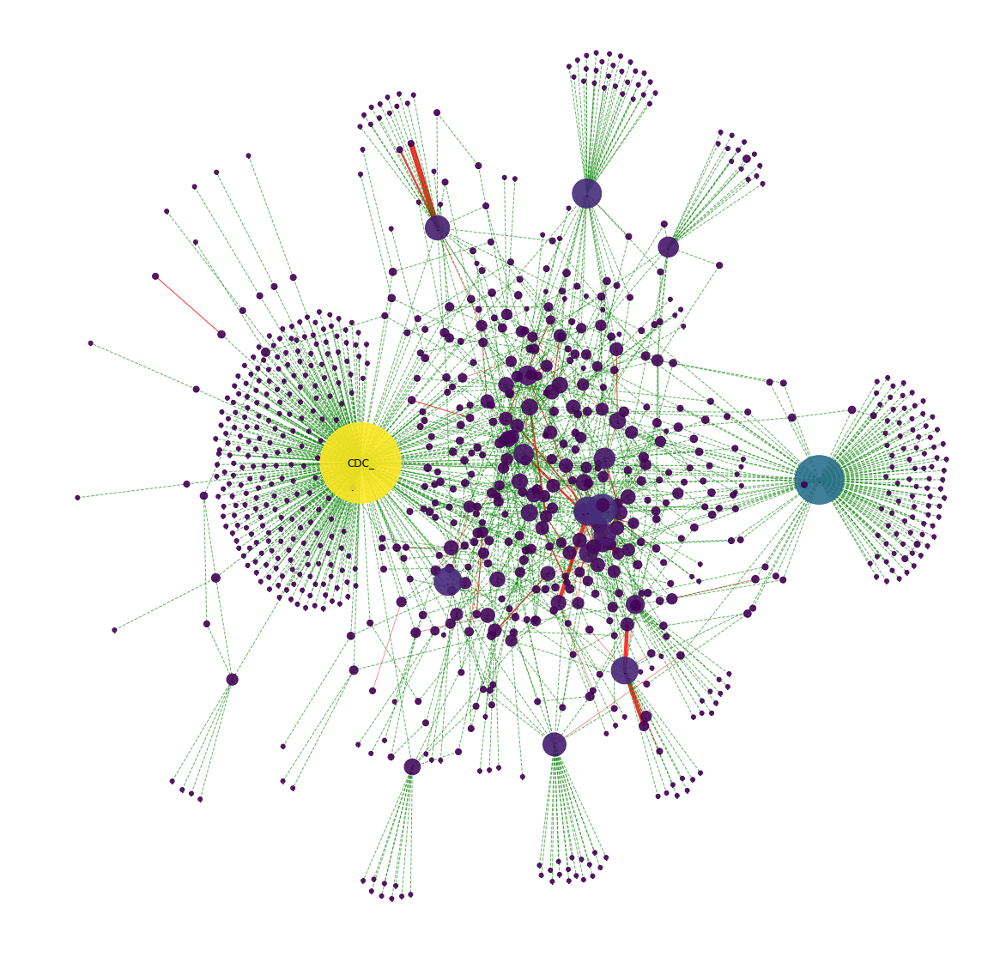

Number of nodes: 866


<Figure size 432x288 with 0 Axes>

In [90]:
G_CDC, W_CDC= graphNeighbors('CDC_')
print('Number of nodes: '+ str(len(G_CDC)))

In [97]:
nx.diameter(G_CDC)

4

In [114]:
centr_bw_w = nx.betweenness_centrality(G_CDC, weight='weight')
sorted(centr_bw_w.items(), key=lambda kv: kv[1], reverse=True)[0:5]

[('CDC_', 0.876375672920552),
 ('killminusnine', 0.25957974201859674),
 ('prostateExamination', 0.0930337384087879),
 ('USOutpost31', 0.05776273583110019),
 ('over_analyst', 0.05487873183378651)]

This is the largest hub in the network. This central node with 2 radius can sum up to 866 nodes with few hubs. The node has direst connection with every hub around. The longest shortest path on the community is 4. the betweenness is 88 %

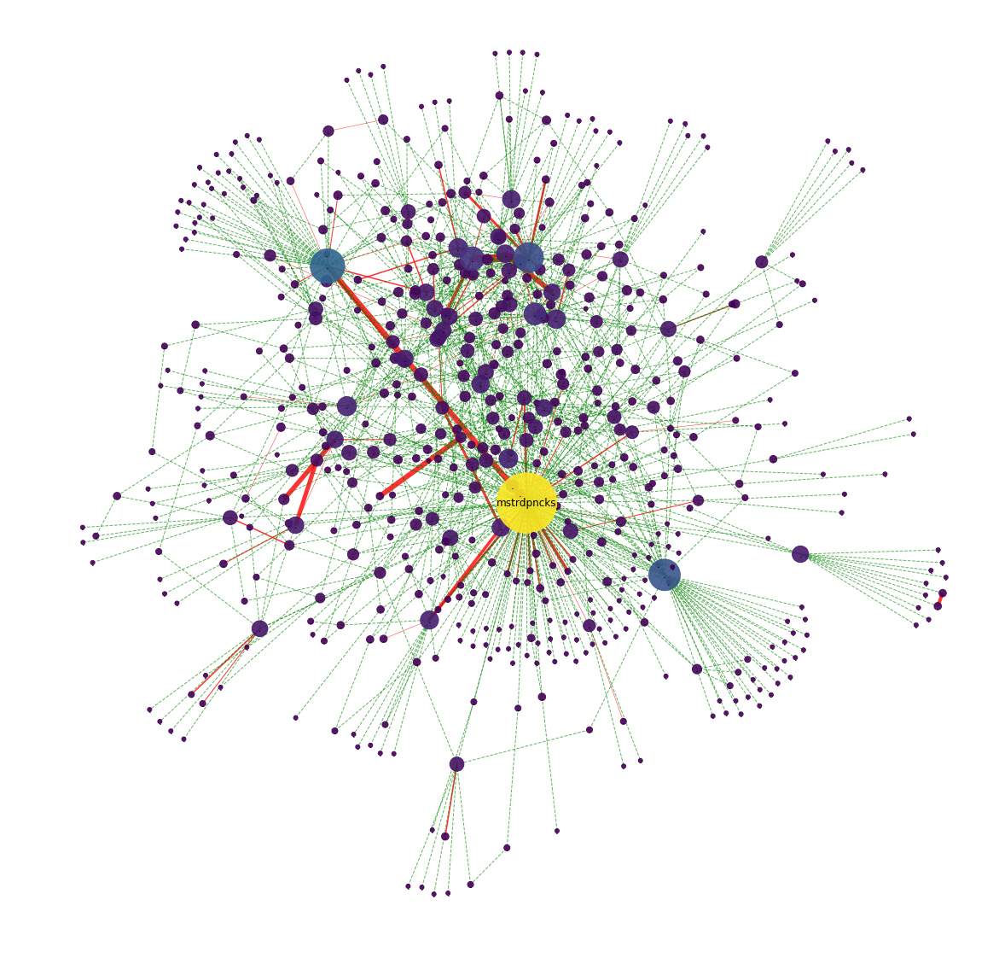

Number of nodes: 594


<Figure size 432x288 with 0 Axes>

In [115]:
G_mstrdpncks, W_mstrdpncks= graphNeighbors('mstrdpncks')
print('Number of nodes: '+ str(len(G_mstrdpncks)))

In [116]:
nx.diameter(G_mstrdpncks)

4

In [117]:
centr_bw_w = nx.betweenness_centrality(G_mstrdpncks, weight='weight')
sorted(centr_bw_w.items(), key=lambda kv: kv[1], reverse=True)[0:2]

[('mstrdpncks', 0.7389729827622415),
 ('jobodhobo', 0.1436613798671268),
 ('Pixelwarlord', 0.11196149196155325),
 ('USOutpost31', 0.08179672191455246),
 ('FirkraagTheRed', 0.04123260167073515)]

This central node with 2 radius can sum up to 594 nodes with few small hubs. The node has direct connection with every hub around. The longest shortest path on the community is 4. The betweenness is 74 %

The following is the community bets partition for the CDC with first neighbors.

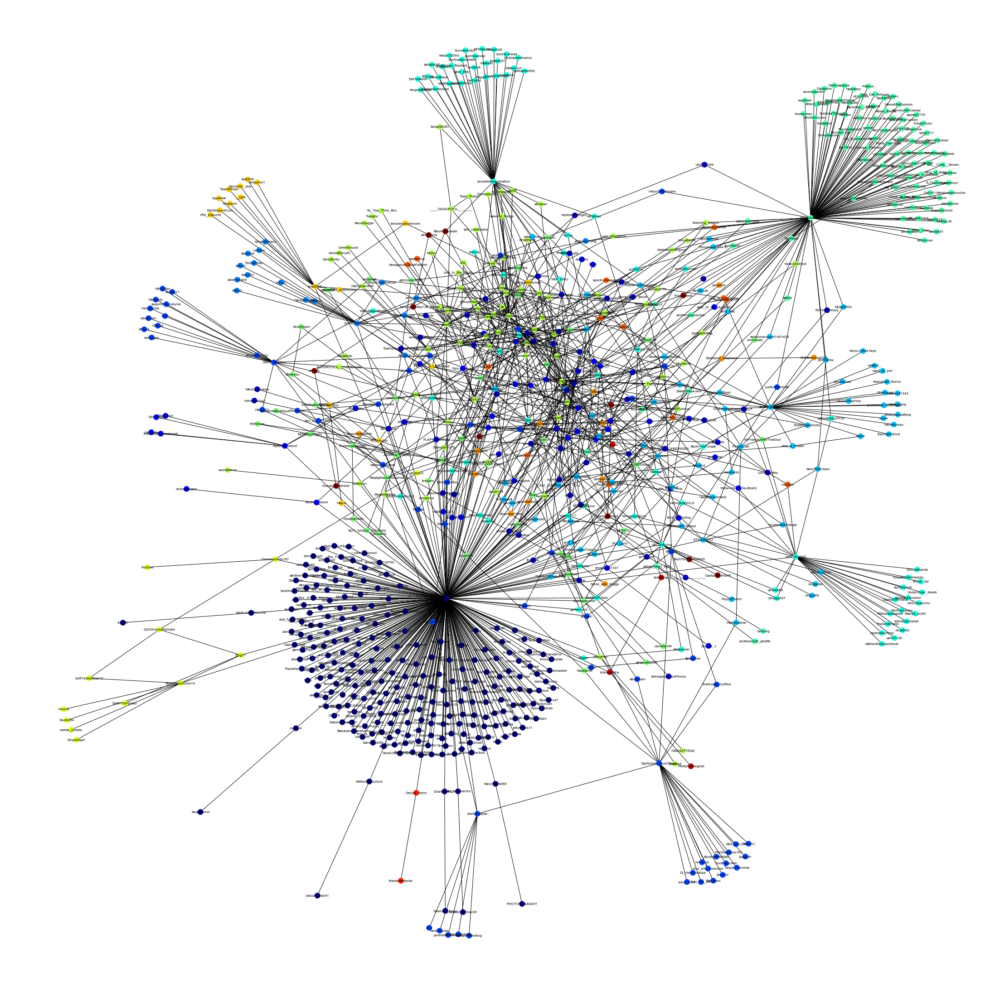

In [334]:
parts = community.best_partition(G_CDC)
values = [parts.get(node) for node in G_CDC.nodes()]
fig = plt.gcf()
fig.set_size_inches(30,30)
nx.draw_spring(G_CDC,cmap = plt.get_cmap('jet'), font_size=8 ,node_color = values, node_size=150, with_labels=True)
plt.show()

## Using the Island Method

Reduce the network into small islands to find cliques within the community that are not visible within the big community hubs.  

Create a bipartite graph 

In [153]:
autors=bi.weighted_projected_graph(G, authorNodes, ratio=False)

Find the length and the connectivity of the network

In [154]:
len(autors.nodes())

10165

In [155]:
len(list(nx.connected_component_subgraphs(autors)))

189

In [160]:
len([len(c) for c in nx.connected_component_subgraphs(autors)
if len(c) <= 2])

178

In [161]:
[len(c) for c in nx.connected_component_subgraphs(autors)
if len(c) > 2]

[9925, 4, 4, 3, 4, 5, 4, 4, 5, 3, 3]

Function from the book to trim the edges to be used in the following island method. I updated the trim edge function to be compatible with python 3.

In [162]:
# updated to python 3 edge trimmer.
# we can plot the output graph from island method 
def trim_edges(g, weight = 1):
    g2 = nx.Graph()
    for f, to, edata in g.edges(data=True):
        if edata['weight'] > weight:
            g2.add_edge(f,to,weight=edata['weight'])
    return g2

In [163]:
def island_method(g, iterations = 5):
    weights = [edata['weight'] for f,to,edata in g.edges(data=True)]
    mn=int(min(weights))
    mx=int(max(weights))
    step = int((mx-mn)/iterations)
    return [[threshold, trim_edges(g, threshold)] for threshold in range(mn,mx,step)]

In [193]:
cc=list(nx.connected_component_subgraphs(autors))[0]

In [194]:
print(nx.info(cc))

Name: 
Type: Graph
Number of nodes: 9925
Number of edges: 313663
Average degree:  63.2066


Use island method with 10 iterations to find the maximum cliques in the network

In [248]:
islands=island_method(cc,6)
islands

[[1, <networkx.classes.graph.Graph at 0x10003588>],
 [2, <networkx.classes.graph.Graph at 0x19db5470>],
 [3, <networkx.classes.graph.Graph at 0x19db5eb8>],
 [4, <networkx.classes.graph.Graph at 0x19db5208>],
 [5, <networkx.classes.graph.Graph at 0x19db5940>],
 [6, <networkx.classes.graph.Graph at 0x19db54e0>],
 [7, <networkx.classes.graph.Graph at 0x19db5d30>],
 [8, <networkx.classes.graph.Graph at 0x19db5978>],
 [9, <networkx.classes.graph.Graph at 0x19db59b0>],
 [10, <networkx.classes.graph.Graph at 0x19db5710>],
 [11, <networkx.classes.graph.Graph at 0x19db5ba8>]]

The followings are the network cliques with their number of nodes and the number of connected nodes.
Within every island created, there are many smallest groups that being exposed.

In [263]:
for i in islands:
    print(i[0],len(i[1]),len(list(nx.connected_component_subgraphs(i[1]))))

1 2121 83
2 440 22
3 164 17
4 80 13
5 48 10
6 34 8
7 14 6
8 7 3
9 2 1
10 2 1
11 2 1


I choose the largest hub with is to plot to see the structure and distribution of the cliques.

In [264]:
isl=islands[0][1]
print(nx.is_connected(isl))

False


In [265]:
nx.number_connected_components(isl)

83

In [266]:
print(list(nx.isolates(isl)))

[]


In [267]:
[len(c) for c in sorted(nx.connected_components(isl), key=len, reverse=True)[0:10]]

[1939, 6, 4, 3, 3, 3, 3, 3, 3, 3]

Find the cliques in the largest network island

In [269]:
cliques = list(nx.find_cliques(isl))

In [270]:
len(cliques)

3654

In [274]:
cliques[0:20]

[['iarforner', 'dicemastaflex', 'USOutpost31', 'ColeSloth', 'sheepsleepdeep'],
 ['iarforner', 'dicemastaflex', 'USOutpost31', 'ColeSloth', 'SynisterSilence'],
 ['iarforner', 'dicemastaflex', 'USOutpost31', 'ColeSloth', 'MLein97'],
 ['iarforner', 'dicemastaflex', 'USOutpost31', 'ColeSloth', 'makattak88'],
 ['iarforner', 'dicemastaflex', 'USOutpost31', 'ColeSloth', 'Abadatha'],
 ['McDaioh', 'sickduck22', 'PricklyPearHair'],
 ['qi1', 'Tortegamos', 'turtlefucker472'],
 ['qi1', 'boochyfliff'],
 ['qi1', 'Linkenten'],
 ['froggym', 'Deggyy'],
 ['froggym', 'KrustyMcGee', 'jwil191'],
 ['froggym', 'KrustyMcGee', 'exadrid'],
 ['froggym', 'toastwithketchup'],
 ['AlexTheChase', 'IncoherentOrange'],
 ['AlexTheChase', 'tehweave', 'FenrisCain'],
 ['AlexTheChase', 'PMME_YOUR_TITS_WOMAN'],
 ['AlexTheChase', 'thecly'],
 ['ryryrpm', 'ComteDeSaintGermain'],
 ['dzrtguy', 'CreamNPeaches'],
 ['OneSeventhofMachoMan', 'uzithekid']]

Plot the network using community best parttion.

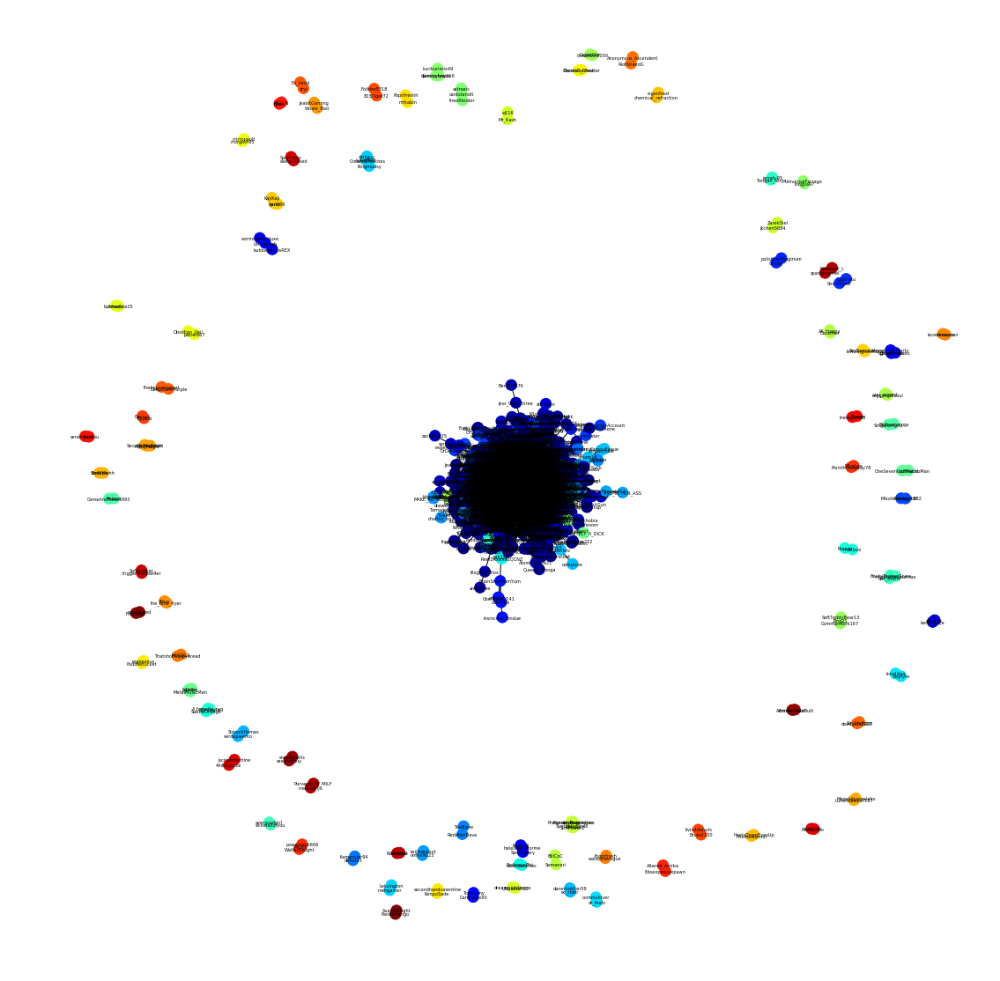

In [259]:
parts = community.best_partition(isl)
values = [parts.get(node) for node in isl.nodes()]
fig = plt.gcf()
fig.set_size_inches(15,15)
nx.draw_spring(isl,cmap = plt.get_cmap('jet'), font_size=5 ,node_color = values, node_size=150, with_labels=True)
plt.show()

In [275]:
centr_bw_w = nx.betweenness_centrality(M, weight='weight')
sorted(centr_bw_w.items(), key=lambda kv: kv[1], reverse=True)[0:2]

[('corby315', 0.07594231744082765), ('USOutpost31', 0.07499997497829372)]

In [276]:
nx.diameter(M)

12

The above graph illustrates and exposes the smallest cliques in the network. The degree centrality dropped to less than 8 % and the diameter of 12 of the network island still high because the interconnection is in the center of the network

## SENTIMENT ANALYSIS

Apply sentiment analysis using the NLTK VADER sentiment analysis tools to find the correlation between sentiment and centrality.

In [34]:
sid = SentimentIntensityAnalyzer()

child_comment = pd.DataFrame()

for i in range(len(reddit_comment)):
    
    # Get sentiment scores for parent and comments
    stats_parent = sid.polarity_scores(reddit_comment['comment_parent'][i])
    stats_child = sid.polarity_scores(reddit_comment['comment_child'][i])
   
    # Select only negative, neutral and positive scores, do not select compound
    stats_parent_sub = dict((k, stats_parent[k]) for k in ('neg', 'neu', 'pos'))
    stats_child_sub = dict((k, stats_child[k]) for k in ('neg', 'neu', 'pos'))
    
    # Select prevalent sentiment
    reddit_comment.loc[reddit_comment.index[i], 'sentiment_parent'] = max(stats_parent_sub.items(), key=operator.itemgetter(1))[0]
    reddit_comment.loc[reddit_comment.index[i], 'sentiment_child'] = max(stats_child_sub.items(), key=operator.itemgetter(1))[0]
    
    # Add child scores to data frame
    child_comment = child_comment.append(stats_child, ignore_index=True)


sentimentAllcol = pd.concat([reddit_comment, child_comment], axis=1)

sentiment=sentimentAllcol[['id','author', 'responder','comment_child', 'sentiment_child','score_compound', 'score_neg', 'score_neu', 'score_pos']]
colnames=['id', 'author', 'responder', 'comment', 'sentiment', 'compound', 'neg', 'neu', 'pos']
sentiment.columns=colnames
sentiment[0:1]


,id,author,responder,comment,sentiment,compound,neg,neu,pos
0,1320251,redditminus,Wheeeler,With face herpes,neu,0.0,0.0,1.0,0.0


## Sentiment Visual Analysis

Before starting the analysis of a large data let’s look at the world positive and negative words sentiment used by the user to get a some clues about type of word negative and positive discussion tones and types.

In [277]:
data = sentiment[['comment','sentiment']]
train, test = train_test_split(data,test_size = 0.1)
test[0:2]
train[0:5]

,comment,sentiment
18532,People can certainly be wrong. But differing o...,neu
14152,Innocent people also get imprisoned all the ti...,neu
10415,I did the same thing to a balding guy. One day...,neu
7308,\r\r\n&gt;I wouldn't want to live in a country...,neu
14343,Way more vinegar ya? Had some home-made pulled...,neu


Delete all neutral sentiments and train the positive and negative sentiments

In [280]:
train = train[train.sentiment != "neu"]
train[0:2]

train_pos = train[ train['sentiment'] == 'pos']
train_pos = train_pos['comment']
train_neg = train[ train['sentiment'] == 'neg']
train_neg = train_neg['comment']

Create a function that filter the input words from some unwanted characters and words and then plot the clean data using the wordcloud plot.

In [278]:
def wordcloud_draw(data, color = 'black'):
    words = ' '.join(data)
    cleaned_word = " ".join([word for word in words.split()
                            if 'http' not in word
                                and not word.startswith('@')
                                and not word.startswith('#')
                                and word != 'RT'
                                and word != 'people'
                            ])
    wordcloud = WordCloud(stopwords=STOPWORDS,
                      background_color=color,
                      width=2500,
                      height=2000
                     ).generate(cleaned_word)
    plt.figure(1,figsize=(13, 13))
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.show()

Plot the words

Positive words


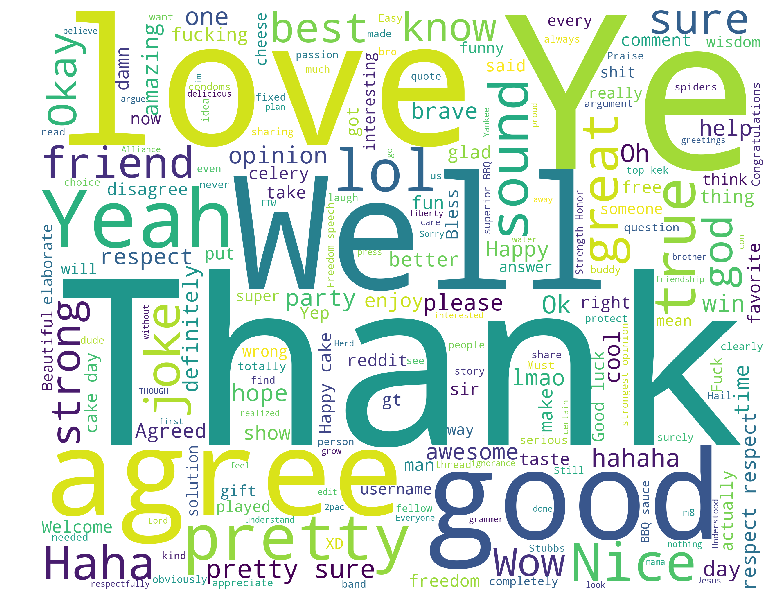

Negative words


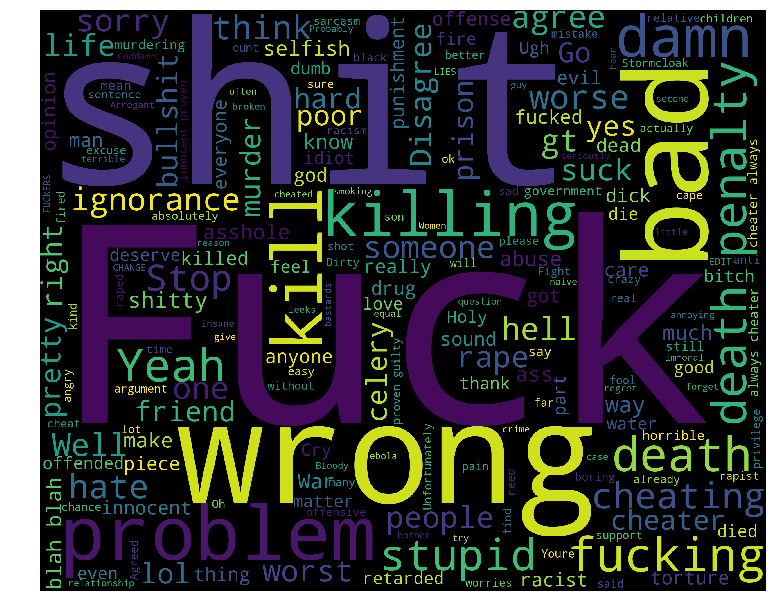

In [281]:
print("Positive words")
wordcloud_draw(train_pos,'white')
print("Negative words")
wordcloud_draw(train_neg)

The most highlighted positive words were tanks, agree, ye, will, love, yeah, good, pretty, strong, etc. While, the highlighted negative words where shit, wrong, fuck, bad, problem, etc. from these words we could tell these conversations were about things people talk about in their everyday life. They don’t seem to be political or economic focus rather than related to differences in opinion and daily people matter.

Lets look into the comment data and its distribution 

In [16]:
sentiment[0:3]

,id,author,responder,comment,sentiment,compound,neg,neu,pos
0,1320251,redditminus,Wheeeler,With face herpes,neu,0.0000,0.000,1.000,0.00
1,1320252,redditminus,corby315,Unfortunately it's the kids that end up gettin...,neu,-0.6597,0.403,0.597,0.00
2,1320253,redditminus,Theemuts,"Nah man, freedom of choice and fuck all conseq...",neu,0.3549,0.213,0.557,0.23


Top 3 negative compound comments

In [287]:
sentiment.sort_values(['compound'], ascending = True)[0:3]

,id,author,responder,comment,sentiment,compound,neg,neu,pos
21099,1362638,illTwinkleYourStar,AppleCoreThing,"I agree with most of this comment, about the p...",neu,-0.9990,0.312,0.591,0.097
14532,1345163,kwhitegocubs,toThe9thPower,"&gt; Revenge does not unrape the raped, resurr...",neu,-0.9990,0.346,0.594,0.060
4840,1328721,SnakeHelah,maypolecrup,&gt; I don't understand the now rising and pop...,neu,-0.9989,0.259,0.639,0.102


Top 3 positive compound comments

In [592]:
sentiment.sort_values(['compound'], ascending = False)[0:3]

,id,author,responder,comment,sentiment,compound,neg,neu,pos
22830,1379322,bulldoozer,CeasarTheFirst,I'm not screaming rhetoric. You implied that m...,neu,0.9990,0.071,0.729,0.201
21864,1368247,kingphysics,0therworldly,&gt; I'm only going to start my undergrad Phys...,neu,0.9977,0.057,0.787,0.156
623,1321385,MeowMixSong,LadyKa,"Hard-core, willfully blind, forcing-their-view...",neu,0.9975,0.020,0.759,0.220


Top 3 negative comments

In [891]:
sentiment.sort_values(['neg'], ascending = False)[0:3]

,id,author,responder,comment,sentiment,compound,neg,neu,pos
1651,1322940,PM_Tits_4_LifeMottos,mivipa,I disagree.,neg,-0.3818,1.0,0.0,0.0
10862,1338623,MrConfucius,BuckYouFungie,No.,neg,-0.2960,1.0,0.0,0.0
2210,1323695,smileedude,aeternitatisdaedalus,WRONG,neg,-0.4767,1.0,0.0,0.0


Top 3 negative comments

In [594]:
sentiment.sort_values(['pos'], ascending = False)[0:3]

,id,author,responder,comment,sentiment,compound,neg,neu,pos
17763,1351540,ADubs62,Executiveabsurdities,Yep.,pos,0.2960,0.0,0.0,1.0
22932,1380907,Stinkybelly,saddstar,Agreed.,pos,0.2732,0.0,0.0,1.0
23446,1394422,05banks,3jt,Congratulations.,pos,0.5994,0.0,0.0,1.0


In [596]:
com=sentiment.sort_values(['compound'], ascending = False)[0:1]['comment']
com=str(com.values.flatten())
print(com)

['I\'m not screaming rhetoric. You implied that my intentions we\'re naive and unfounded. I don\'t have all of the answers, no one does. Even if I attempted to answer all of them, there\'s a sound argument against them. You\'re right it\'s not black and white, however, neither is the solution to this. \r\r\n \r\r\nCapitalism is not a long-term sustainable solution, much in the same way communism is not a good conductor of progress/innovation. The nature of both systems lead to failure. \r\r\n \r\r\nCapitalism in the US and abroad has lasted as long as it has because there is a mix of socialism in there; obviously, moreso in the EU than in the US, but it provides a level of sustainability to society. The spoils (money) generated by a capitalist society are partially spread to everyone. In a way one could argue that everyone played a part in everyone\'s success, because things happened the way they did. \r\r\n \r\r\nCapitalism fails in that it\'s not the real system, it\'s just somewhat 

Count plot for the three sentiments. The Neutral seems to be the dominant.

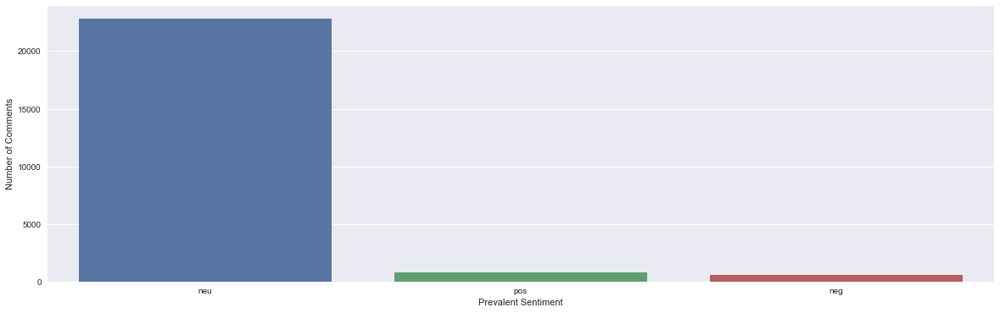

In [294]:
# Plot prevalent sentiment of comments
import seaborn as sns

fig = plt.gcf()
fig.set_size_inches(20,6)
sns.set(style="darkgrid")
sns.countplot(x="sentiment", data = sentiment)
plt.ylabel('Number of Comments')
plt.xlabel('Prevalent Sentiment')
plt.show()

In [300]:
sneg=sentiment[(sentiment['neg']>0.00001) & (sentiment['neg']<0.99999)]
spos=sentiment[(sentiment['pos']>0.00001) & (sentiment['pos']<0.99999)]
sneu=sentiment[(sentiment['neu']<0.99999) & (sentiment['neu']>0.00001)]
scom=sentiment[(sentiment['compound']<-0.00001) | (sentiment['compound']>0.00001)]

s1neu=sentiment[sentiment['neu']>0.88]
s0neu=sentiment[sentiment['neu']<0.1]
s0com=sentiment[(sentiment['compound']>-0.4) & (sentiment['compound']<0.4)]
s0neg=sentiment[sentiment['neg']<0.1]
s0pos=sentiment[sentiment['pos']<0.1]


In [301]:
def countsTF(feild,logic):
    countT=0
    countF=0
    f=sentiment[feild]==logic
    for x in f:
        if x:
            countT=countT+1
        else:
            countF=countF+1
    return countT, countF

Histograms og the three sentiments and the Compound

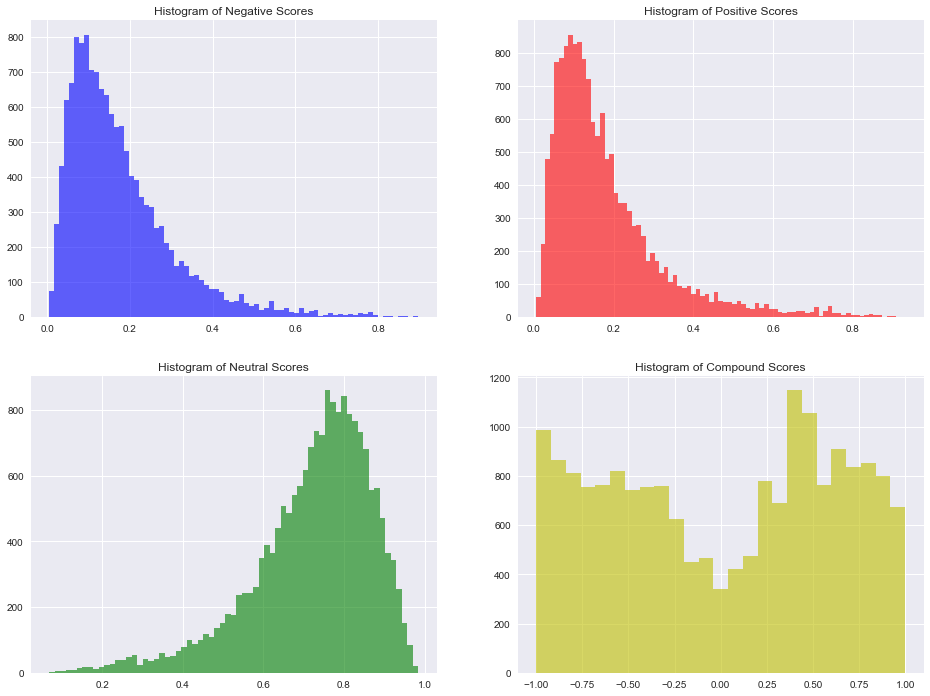

In [302]:
plt.figure(figsize=(16, 12))
plt.subplot(221)
plt.hist(sneg['neg'], bins='auto',color='b',alpha=0.6)
plt.title("Histogram of Negative Scores")

plt.subplot(222)
plt.hist(spos['pos'], bins='auto',color='r',alpha=0.6)
plt.title("Histogram of Positive Scores")

plt.subplot(223)
plt.hist(sneu['neu'], bins='auto',color='g',alpha=0.6)
plt.title("Histogram of Neutral Scores")

plt.subplot(224)
plt.hist(scom['compound'], bins='auto',color='y',alpha=0.6)
plt.title("Histogram of Compound Scores")
plt.show()

I excluded the ones and zeros from the above distribution because they were creating confusion since zero negative and positive indicates that it is 100% natural and 0% positive or negative.
From the above histograms we could tell that the compound is decaying toward the center, the zero position. The positive and negative skewed to the right with maximum height of 800.

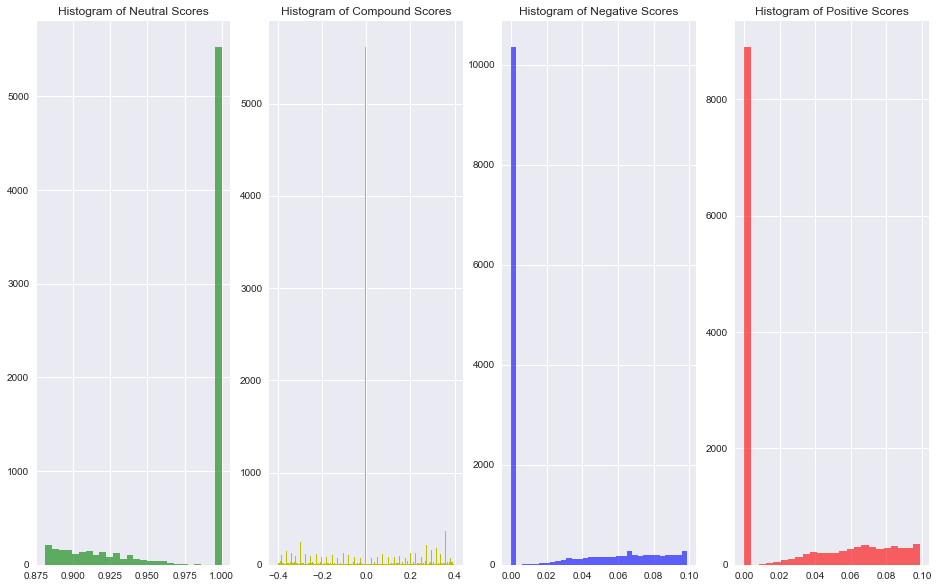

In [305]:
plt.figure(figsize=(16, 10))
plt.subplot(141)
plt.hist(s1neu['neu'],bins='auto',color='g',alpha=0.6)
plt.title("Histogram of Neutral Scores")

plt.subplot(142)
plt.hist(s0com['compound'],bins='auto',color='y')
plt.title("Histogram of Compound Scores")

plt.subplot(143)
plt.hist(s0neg['neg'],bins='auto',color='b',alpha=0.6)
plt.title("Histogram of Negative Scores")

plt.subplot(144)
plt.hist(s0pos['pos'],bins='auto',color='r',alpha=0.6)
plt.title("Histogram of Positive Scores")


plt.show()

The above histograms show that around 5000 of the comments were 10% Neutral and 5000 compound comments are zero value, which means the same. The 10000 comments of negative and 9000 of positive with zero values indicate that these comments are neither positive nor negative.  

## Sentiment and centrality correlation

Analyze the correlation between centrality and sentiment

In [313]:
avg_sentiment = sentiment.groupby(['responder'])['compound'].agg(['mean', 'count']).reset_index()
avg_sentiment.rename(columns={'responder': 'User', 'mean': 'avg_sentiment'}, inplace=True)

In [314]:
sentiment_analysis = users.merge(avg_sentiment,on=['User'])
sentiment_analysis[0:10]

,User,Betweenness,Degree,avg_sentiment,count
0,mstrdpncks,0.738973,0.017341,0.231965,81
1,jobodhobo,0.143661,0.005780,0.315850,4
2,Pixelwarlord,0.111961,0.017341,-0.006827,30
3,USOutpost31,0.081797,NaN,0.126010,31
4,FirkraagTheRed,0.041233,NaN,0.389800,1
5,danman11,0.039837,0.014451,-0.056250,18
6,DerJawsh,0.033911,NaN,-0.129942,12
7,wontonsoupsucka,0.033783,0.014451,-0.154467,9
8,rg90184,0.030508,NaN,-0.023887,15
9,Portalman4,0.029827,NaN,-0.099759,29


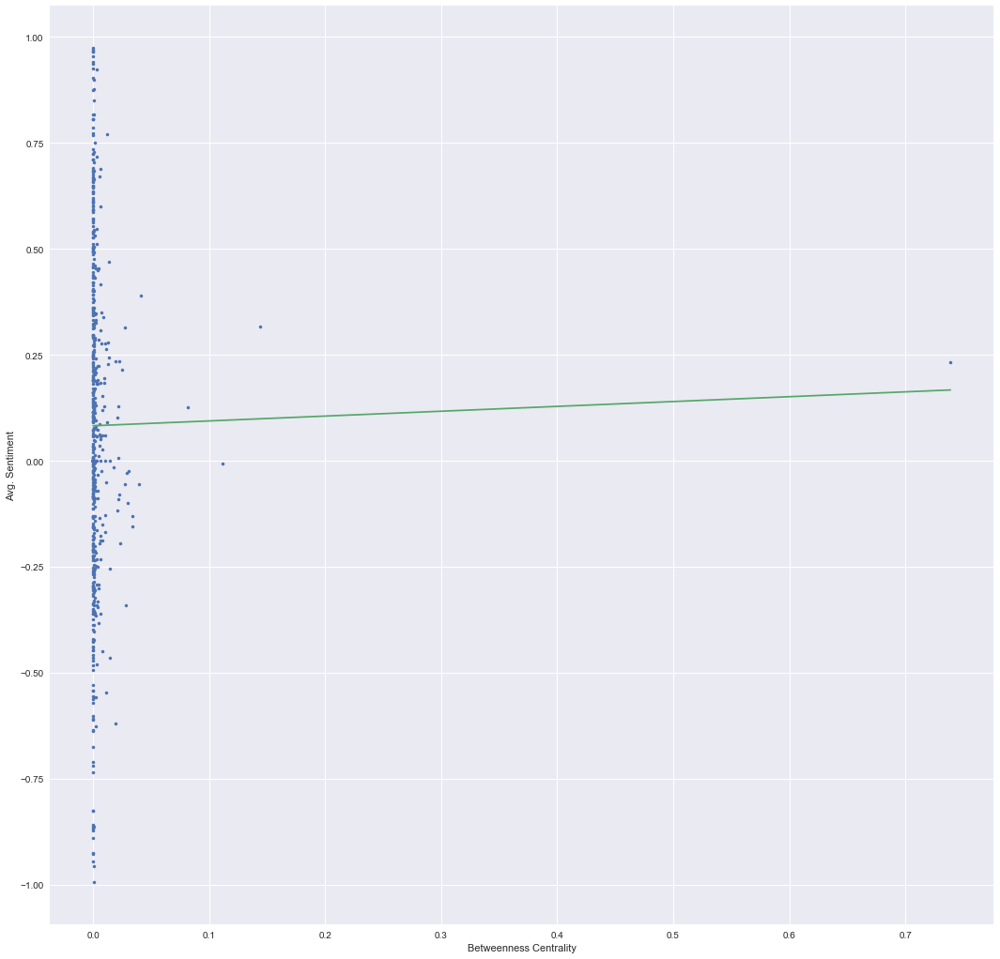

<Figure size 432x288 with 0 Axes>

In [316]:
x = sentiment_analysis.loc[:,"Betweenness"].values
y = sentiment_analysis.loc[:,"avg_sentiment"].values

# Least squares polynomial fit
m, b = np.polyfit(x, y, 1)

plt.figure(figsize=(18, 18))
plt.plot(x, y, '.')
plt.plot(x, m*x + b, '-')
plt.xlabel("Betweenness Centrality")
plt.ylabel("Avg. Sentiment")
plt.show()
plt.gcf().clear()

In [318]:
scipy.stats.pearsonr(x, y)

(0.009700229510342, 0.8156729059525496)

The above graph with horizontal line shows a lock of relationship.

CONCLUSION
At the end I have determined that there is no correlation between sentiment scores and betweenness centrality. The user negative and positive comments were not influenced by the center nodes. It was just user interaction developed Interactions. The words show that these conversations were based on people lives rather than political and economic.
Comments include irony, sarcasm, humor, slang and all of this makes it difficult to determine definitive sentiment. 
